# Neural Networks with Keras

In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd

import re

In [2]:
import json
import gzip

def parse(path):
  g = gzip.open(path, 'r')
  for l in g:
    yield json.dumps(eval(l))
      

f = open("output.strict", 'w')
for l in parse("reviews_Musical_Instruments_5.json.gz"):
  f.write(l + '\n')

for m in parse("reviews_Clothing_Shoes_and_Jewelry_5.json.gz"):
  f.write(m + '\n')

for n in parse("reviews_Automotive_5.json.gz"):
  f.write(n + '\n')

print(f)

<_io.TextIOWrapper name='output.strict' mode='w' encoding='cp1252'>


Use train_test_split to create training and testing data

In [3]:
import pandas as pd
import gzip

def parse(path):
  g = gzip.open(path, 'rb')
  for l in g:
    yield eval(l)

def getDF(path):
  i = 0
  df1 = {}
  for d in parse(path):
    df1[i] = d
    i += 1
  return pd.DataFrame.from_dict(df1, orient='index')

df1 = getDF('reviews_Musical_Instruments_5.json.gz')


df1.head()

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]","Not much to write about here, but it does exac...",5.0,good,1393545600,"02 28, 2014"
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",The product does exactly as it should and is q...,5.0,Jake,1363392000,"03 16, 2013"
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",The primary job of this device is to block the...,5.0,It Does The Job Well,1377648000,"08 28, 2013"
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",Nice windscreen protects my MXL mic and preven...,5.0,GOOD WINDSCREEN FOR THE MONEY,1392336000,"02 14, 2014"
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",This pop filter is great. It looks and perform...,5.0,No more pops when I record my vocals.,1392940800,"02 21, 2014"


In [4]:
df1.columns

Index(['reviewerID', 'asin', 'reviewerName', 'helpful', 'reviewText',
       'overall', 'summary', 'unixReviewTime', 'reviewTime'],
      dtype='object')

In [6]:
df1.count()

reviewerID        10261
asin              10261
reviewerName      10234
helpful           10261
reviewText        10261
overall           10261
summary           10261
unixReviewTime    10261
reviewTime        10261
dtype: int64

In [7]:
import pandas as pd
import gzip

def parse(path):
  g = gzip.open(path, 'rb')
  for l in g:
    yield eval(l)

def getDF(path):
  i = 0
  df3 = {}
  for d in parse(path):
    df3[i] = d
    i += 1
  return pd.DataFrame.from_dict(df3, orient='index')

df3 = getDF('reviews_Automotive_5.json.gz')


df3.head()

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A3F73SC1LY51OO,B00002243X,Alan Montgomery,"[4, 4]",I needed a set of jumper cables for my new car...,5.0,Work Well - Should Have Bought Longer Ones,1313539200,"08 17, 2011"
1,A20S66SKYXULG2,B00002243X,alphonse,"[1, 1]","These long cables work fine for my truck, but ...",4.0,Okay long cables,1315094400,"09 4, 2011"
2,A2I8LFSN2IS5EO,B00002243X,Chris,"[0, 0]",Can't comment much on these since they have no...,5.0,Looks and feels heavy Duty,1374710400,"07 25, 2013"
3,A3GT2EWQSO45ZG,B00002243X,DeusEx,"[19, 19]",I absolutley love Amazon!!! For the price of ...,5.0,Excellent choice for Jumper Cables!!!,1292889600,"12 21, 2010"
4,A3ESWJPAVRPWB4,B00002243X,E. Hernandez,"[0, 0]",I purchased the 12' feet long cable set and th...,5.0,"Excellent, High Quality Starter Cables",1341360000,"07 4, 2012"


In [8]:
df3.columns

Index(['reviewerID', 'asin', 'reviewerName', 'helpful', 'reviewText',
       'overall', 'summary', 'unixReviewTime', 'reviewTime'],
      dtype='object')

In [9]:
df3.count()

reviewerID        20473
asin              20473
reviewerName      20260
helpful           20473
reviewText        20473
overall           20473
summary           20473
unixReviewTime    20473
reviewTime        20473
dtype: int64

In [10]:
import pandas as pd
import gzip

def parse(path):
  g = gzip.open(path, 'rb')
  for l in g:
    yield eval(l)

def getDF(path):
  i = 0
  df2 = {}
  for d in parse(path):
    df2[i] = d
    i += 1
  return pd.DataFrame.from_dict(df2, orient='index')

df2 = getDF('reviews_Clothing_Shoes_and_Jewelry_5.json.gz')


df2.head()

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A1KLRMWW2FWPL4,0000031887,"Amazon Customer ""cameramom""","[0, 0]",This is a great tutu and at a really great pri...,5.0,Great tutu- not cheaply made,1297468800,"02 12, 2011"
1,A2G5TCU2WDFZ65,0000031887,Amazon Customer,"[0, 0]",I bought this for my 4 yr old daughter for dan...,5.0,Very Cute!!,1358553600,"01 19, 2013"
2,A1RLQXYNCMWRWN,0000031887,Carola,"[0, 0]",What can I say... my daughters have it in oran...,5.0,I have buy more than one,1357257600,"01 4, 2013"
3,A8U3FAMSJVHS5,0000031887,Caromcg,"[0, 0]","We bought several tutus at once, and they are ...",5.0,"Adorable, Sturdy",1398556800,"04 27, 2014"
4,A3GEOILWLK86XM,0000031887,CJ,"[0, 0]",Thank you Halo Heaven great product for Little...,5.0,Grammy's Angels Love it,1394841600,"03 15, 2014"


In [11]:
df2.columns

Index(['reviewerID', 'asin', 'reviewerName', 'helpful', 'reviewText',
       'overall', 'summary', 'unixReviewTime', 'reviewTime'],
      dtype='object')

In [12]:
df2.count()

reviewerID        278677
asin              278677
reviewerName      278225
helpful           278677
reviewText        278677
overall           278677
summary           278677
unixReviewTime    278677
reviewTime        278677
dtype: int64

In [13]:
rating1df = df2.loc[df2["overall"] == 1.0]
rating2df = df2.loc[df2["overall"] == 2.0]
rating3df = df2.loc[df2["overall"] == 3.0]
#rating4df = df2.loc[df2["overall"] == 4.0]

#print(rating1df.count())
#print(rating2df.count())
#print(rating3df.count())

In [14]:
df2.drop(df2[df2.overall == 5.0].index, inplace=True)
df2.count()

reviewerID        115437
asin              115437
reviewerName      115271
helpful           115437
reviewText        115437
overall           115437
summary           115437
unixReviewTime    115437
reviewTime        115437
dtype: int64

In [15]:
df1.drop(df1[df1.overall == 4.0].index, inplace=True)
df1.count()

reviewerID        8177
asin              8177
reviewerName      8154
helpful           8177
reviewText        8177
overall           8177
summary           8177
unixReviewTime    8177
reviewTime        8177
dtype: int64

In [16]:
df = [df1, df2, df3, rating1df, rating2df, rating3df]

combined_df = pd.concat(df)
combined_df.count()

reviewerID        201167
asin              201167
reviewerName      200682
helpful           201167
reviewText        201167
overall           201167
summary           201167
unixReviewTime    201167
reviewTime        201167
dtype: int64

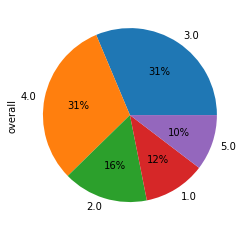

In [17]:
plt = combined_df.overall.value_counts().plot(kind='pie', autopct='%1.0f%%')

In [18]:
# Dropping the unwanted columns
cleaned_df = combined_df[['reviewText', 'overall']]
cleaned_df.head()


,reviewText,overall
0,"Not much to write about here, but it does exac...",5.0
1,The product does exactly as it should and is q...,5.0
2,The primary job of this device is to block the...,5.0
3,Nice windscreen protects my MXL mic and preven...,5.0
4,This pop filter is great. It looks and perform...,5.0


In [19]:
cleaned_df.count()

reviewText    201167
overall       201167
dtype: int64

In [20]:
#creating additional polar emotion column for ratings
def review_cat (row):
   if row['overall'] == 5.0 :
      return 'Positive'
   if row['overall'] == 4.0 :
      return 'Positive'
   if row['overall'] == 3.0:
      return 'Neutral'
   if row['overall']  == 2.0:
      return 'Negative'
   if row['overall'] == 1.0:
      return 'Negative'

cleaned_df['Review_Sentiment'] = cleaned_df.apply (lambda row: review_cat(row), axis=1)

print(cleaned_df.head())

cleaned_df.count()

                                          reviewText  overall Review_Sentiment
0  Not much to write about here, but it does exac...      5.0         Positive
1  The product does exactly as it should and is q...      5.0         Positive
2  The primary job of this device is to block the...      5.0         Positive
3  Nice windscreen protects my MXL mic and preven...      5.0         Positive
4  This pop filter is great. It looks and perform...      5.0         Positive


C:\Users\HimaniAkshay\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


reviewText          201167
overall             201167
Review_Sentiment    201167
dtype: int64

In [21]:
# Datatype of each column
cleaned_df.dtypes

reviewText           object
overall             float64
Review_Sentiment     object
dtype: object

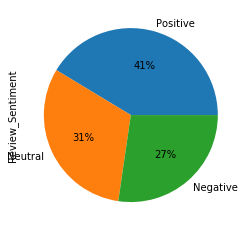

In [24]:
plt = cleaned_df.Review_Sentiment.value_counts().plot(kind='pie', autopct='%1.0f%%')

In [23]:
# Step 0: Reformat data
data = cleaned_df.values
X = data[:, 0]
y = data[:, 2]

print(X)
print(y)

["Not much to write about here, but it does exactly what it's supposed to. filters out the pop sounds. now my recordings are much more crisp. it is one of the lowest prices pop filters on amazon so might as well buy it, they honestly work the same despite their pricing,"
 "The product does exactly as it should and is quite affordable.I did not realized it was double screened until it arrived, so it was even better than I had expected.As an added bonus, one of the screens carries a small hint of the smell of an old grape candy I used to buy, so for reminiscent's sake, I cannot stop putting the pop filter next to my nose and smelling it after recording. :DIf you needed a pop filter, this will work just as well as the expensive ones, and it may even come with a pleasing aroma like mine did!Buy this product! :]"
 'The primary job of this device is to block the breath that would otherwise produce a popping sound, while allowing your voice to pass through with no noticeable reduction of volu

In [25]:
from sklearn.preprocessing import LabelEncoder

# Step 1: Label-encode data set
label_encoder = LabelEncoder()
label_encoder.fit(y)
encoded_y = label_encoder.transform(y)
print (encoded_y)

[2 2 2 ... 1 1 1]


In [26]:
for label, original_class in zip(encoded_y, y):
    print('Original Class: ' + str(original_class))
    print('Encoded Label: ' + str(label))
    print('-' * 12)

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Cla

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
----------

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Lab

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
O

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------

Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Lab

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
-----------

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded La

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Clas

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------

Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Labe

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
-----------

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------


------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
-----------

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Or

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Cla

Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Clas

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Po

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class

Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded La

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Labe

Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: N

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Ori

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Clas

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Orig

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
-----------

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1


Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class:

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
O

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Clas

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Ne

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Or

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class

Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
-----------

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: P

Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Ori

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Ori

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label:

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Or

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: 

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
O

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Ori

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Cla

Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
---

Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label:

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Or

Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2


Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: 

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------


------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
O

Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class:

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Or

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
O

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Orig

Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Ne

Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
O

Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Po

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label:

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Or

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
O

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: 

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Cla

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
O

Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Orig

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------

Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0

Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Cla

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: 

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Cla

Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Ne

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Orig

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Origin

Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label:

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Or

Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label:

Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label:

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: 

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------


------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Or

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
O

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label:

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Or

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2

Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label:

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
O

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------


------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
O

Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2

Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Lab

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Po

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------


------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
O

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class:

Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Labe

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Cla

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
O

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Clas

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
O

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Clas

Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Labe

Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: 

Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: P

Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class:

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Or

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 

Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Clas

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Clas

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Cla

Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1

Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Labe

Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-

Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
--

Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0

Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label:

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
O

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Ori

Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label:

Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label:

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Cla

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: N

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class:

Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: N

Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label:

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------


Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label

Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: 

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: 

Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Cla

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: 

Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1


Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Ne

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------


Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Pos

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------


Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Labe

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Ori

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Orig

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Labe

Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class:

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label:

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Or

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: P

Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 

Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: 

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label:

Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Cla

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------


------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
O

Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Orig

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Clas

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Or

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Or

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Or

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Or

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Origi

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------


------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Orig

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
O

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Ori

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Or

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------


Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: 

Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label:

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Ori

Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1

Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 

Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class:

Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Cla

Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
O

Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1


------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Ori

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Orig

Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: 

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Cla

Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label

Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Labe

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Ori

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Labe

Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class

Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: 

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class:

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
O

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Or

Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: 

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 

Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2

Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label:

Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: 

Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 

Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label

Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label:

Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label:

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------


Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class:

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Or

Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label:

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Origina

Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2


------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Or

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Ne

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Ori

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Orig

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
----------

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Clas

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Ori

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
O

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Origi

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: 

Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1


------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Orig

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------


------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Origi

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Origi

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Cl

Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Lab

Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Labe

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Ori

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Or

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Or

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------

Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Cla

Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2

Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: 

Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0


Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1


Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Clas

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
O

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
-

Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Cl

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Cl

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded La

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Cl

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Lab

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Cl

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
----------

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
----------

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded La

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
----------

Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Lab

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
----------

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Lab

Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Clas

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
-----------

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
----------

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
-----------

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Cl

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Labe

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Lab

Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
----------

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Cl

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
O

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Cl

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
----------

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
O

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded La

Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Lab

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Cl

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded La

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
-----------

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
O

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
O

Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Clas

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Lab

------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
O

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Labe

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------

Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Labe

Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original Class: Positive
Encoded Label: 2
------------
Original C

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded La

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded La

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded La

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded La

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded La

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded La

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded La

Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded La

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded La

Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded La

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original C

------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
------------
Original Class: Negative
Encoded Label: 0
----------

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class:

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Enco

Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
-----------

Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------
Original Class: Neutral
Encoded Label: 1
------------


In [ ]:
#Creating an extra column to convert ratings to binary 
#1,2 ratings - 0 and 4,5 ratings - 1, removed rating 3 as it is neutral

#from keras.utils import to_categorical

# Step 2: One-hot encoding
#one_hot_y = to_categorical(encoded_y)
#one_hot_y
#one_hot_y.shape

In [27]:
X.shape

(201167,)

In [28]:
processed_features = []

for sentence in range(0, len(X)):
    # Remove all the special characters
    processed_feature = re.sub(r'\W', ' ', str(X[sentence]))

    # remove all single characters
    processed_feature= re.sub(r'\s+[a-zA-Z]\s+', ' ', processed_feature)

    # Remove single characters from the start
    processed_feature = re.sub(r'\^[a-zA-Z]\s+', ' ', processed_feature) 

    # Substituting multiple spaces with single space
    processed_feature = re.sub(r'\s+', ' ', processed_feature, flags=re.I)

    # Removing prefixed 'b'
#    processed_feature = re.sub(r'^b\s+', '', processed_feature)

    # Converting to Lowercase
    processed_feature = processed_feature.lower()

    processed_features.append(processed_feature)
    
    

In [29]:
features = np.array(processed_features)
features.shape

(201167,)

In [30]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(processed_features, encoded_y, test_size=0.2, random_state=42)


In [31]:
import nltk
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(min_df=2, tokenizer=nltk.word_tokenize, max_features=5000, stop_words=stopwords.words('english'))

vectorized_features_trained = vectorizer.fit_transform(X_train)



C:\Users\HimaniAkshay\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:300: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ["'d", "'ll", "'re", "'s", "'ve", 'could', 'might', 'must', "n't", 'need', 'sha', 'wo', 'would'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


In [32]:
vectorized_features_trained.shape

(160933, 5000)

In [33]:
from sklearn.feature_extraction.text import TfidfTransformer
reviewTF = TfidfTransformer()
review_train_tfidf = reviewTF.fit_transform(vectorized_features_trained)

In [34]:
review_train_tfidf.shape

(160933, 5000)

In [35]:
vectorized_features_tested = vectorizer.transform(X_test)
review_test_tfidf = reviewTF.transform(vectorized_features_tested)

In [36]:
review_test_tfidf.shape

(40234, 5000)

In [37]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=200, random_state=0)
rf.fit(review_train_tfidf, y_train)

KeyboardInterrupt: 

In [ ]:
predictions = rf.predict(review_test_tfidf)

In [ ]:
# Making the Confusion Matrix
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(accuracy_score(y_test, predictions))
print(classification_report(y_test,predictions))
cm = confusion_matrix(y_test, predictions)
cm

In [ ]:
# very short and fake movie reviews
new_data = ['this is a very bad news. i hate it']

reviews_new = vectorizer.transform(new_data)         # turn text into count vector
reviews_new_tfidf = reviewTF.transform(reviews_new)  # turn into tfidf vector

In [ ]:
# have RFclassifier make a prediction
pred = rf.predict(reviews_new_tfidf)

In [ ]:
# print out results
for review, category in zip(new_data, pred):
    print('%r => %s' % (review, category))

In [ ]:
# Support vector machine linear classifier
from sklearn.svm import SVC 
svmmodel = SVC(kernel='linear')
svmmodel.fit(review_train_tfidf, y_train)

In [ ]:
predictions = svmmodel.predict(review_test_tfidf)

## Data Preprocessing

It is really important to scale our data before using multilayer perceptron models. 

Without scaling, it is often difficult for the training cycle to converge

In [ ]:
from sklearn.preprocessing import StandardScaler

X_scaler = StandardScaler().fit(X_train)

Remember to scale both the training and testing data

In [ ]:
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

One-hot encode the labels

In [ ]:
from tensorflow.keras.utils import to_categorical

In [ ]:
# One-hot encoding
y_train_categorical = to_categorical(y_train)
y_test_categorical = to_categorical(y_test)
y_train_categorical

## Creating our Model

We must first decide what kind of model to apply to our data. 

For numerical data, we use a regressor model. 

For categorical data, we use a classifier model. 

In this example, we will use a classifier to build the following network:

![nnet.png](../Images/nnet.png)

## Defining our Model Architecture (the layers)

We first need to create a sequential model

In [ ]:
from tensorflow.keras.models import Sequential

model = Sequential()

Next, we add our first layer. This layer requires you to specify both the number of inputs and the number of nodes that you want in the hidden layer.

In [ ]:
from tensorflow.keras.layers import Dense
number_inputs = 3
number_hidden_nodes = 4
model.add(Dense(units=number_hidden_nodes,
                activation='relu', input_dim=number_inputs))

![first_layer](../Images/nnet_first_layer.png)

Our final layer is the output layer. Here, we need to specify the activation function (typically `softmax` for classification) and the number of classes (labels) that we are trying to predict (2 in this example).

In [ ]:
number_classes = 2
model.add(Dense(units=number_classes, activation='softmax'))

![output_layer](../Images/nnet_output_layer.png)

## Model Summary

In [ ]:
model.summary()

## Compile the Model

Now that we have our model architecture defined, we must compile the model using a loss function and optimizer. We can also specify additional training metrics such as accuracy.

In [ ]:
# Use categorical crossentropy for categorical data and mean squared error for regression
# Hint: your output layer in this example is using software for logistic regression (categorical)
# If your output layer activation was `linear` then you may want to use `mse` for loss
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

## Training the Model
Finally, we train our model using our training data

Training consists of updating our weights using our optimizer and loss function. In this example, we choose 1000 iterations (loops) of training that are called epochs.

We also choose to shuffle our training data and increase the detail printed out during each training cycle.

In [ ]:
# Fit (train) the model
model.fit(
    X_train_scaled,
    y_train_categorical,
    epochs=1000,
    shuffle=True,
    verbose=2
)

## Quantifying the Model
We use our testing data to validate our model. This is how we determine the validity of our model (i.e. the ability to predict new and previously unseen data points)

In [ ]:
# Evaluate the model using the testing data
model_loss, model_accuracy = model.evaluate(
    X_test_scaled, y_test_categorical, verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

## Making Predictions with new data

We can use our trained model to make predictions using `model.predict`

In [ ]:
import numpy as np
new_data = np.array([[0.2, 0.3, 0.4]])
print(f"Predicted class: {model.predict_classes(new_data)}")